### Detect peaks in quasicrystal patterns and render corresponding Voronois / Delaunay meshes

In [56]:
%matplotlib inline

# To show complex graphics, you may need to strat Jupyter with this command
# jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

from numpy import *
from matplotlib.pylab import *
import scipy
import scipy.spatial

# Grab the neurotools package from githup (lost of un-tested random code, not sure if neeeded)
#from neurotools.nlab import *
#from neurotools.stats.gmm import *
from neurotools.plot import *
from neurotools.color import *

In [57]:
K  = 17*10*5 # frequency of waves. Higher = more
N  = 5000  # size of domain for rasterizing
M  = 12     # number of waves

x  = linspace(-1,1,N)
y  = linspace(-1,1,N)
xy = x[:,None] + 1j*y[None,:]

(1+0j)
(0.965925826289+0.258819045103j)
(0.866025403784+0.5j)
(0.707106781187+0.707106781187j)
(0.5+0.866025403784j)
(0.258819045103+0.965925826289j)
(6.12323399574e-17+1j)
(-0.258819045103+0.965925826289j)
(-0.5+0.866025403784j)
(-0.707106781187+0.707106781187j)
(-0.866025403784+0.5j)
(-0.965925826289+0.258819045103j)


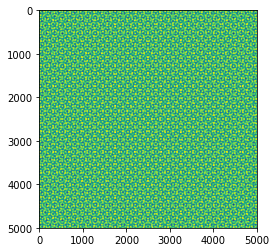

In [58]:
# for symmetric

phases = zeros(M)

# for random
#phases = rand(M)*2*pi

phases = ones(M)*pi

rotation = exp(linspace(0,pi,M+1)[:M]*1j)
xyr = array(xy)*0
for p,rr in zip(phases,rotation):
    print(rr)
    xyr += cos(real(xy*rr)*K+p)
qq = xyr
imshow(real(qq))

-5
-4
-3
-2
-1
0
1
2
3
4
5


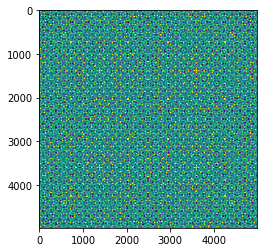

In [59]:
radius = 5 # expected size of local maxima in pixels
rr = radius**2
d  = radius+1
count = zeros(shape(qq[d:-d,d:-d]))
norm  = 0
for i in arange(-radius,radius+1):
    print(i)
    for j in arange(-radius,radius+1):
        if i*i+j*j>rr: continue
        count += qq[d+i:i-d,d+j:j-d]>qq[d:-d,d:-d]
        norm+=1
count /= norm
imshow(count)

In [60]:
from collections import defaultdict

def z2xy(z):
    '''
    Converts an array of complex numbers into two arrays
    representing real and imaginary parts, respectively.
    '''
    return real(z),imag(z)

def uniquerow(x):
    '''
    Removes duplicate rows from a 2D numpy array
    '''
    return array(list(set(map(tuple,x))))

def trianglesToEdges(triangles):
    '''
    Accepts Ntriangles x 3 array of triangle indeces, like the format
    returned by `scipy.spatial.Delaunay(...).simplices`. Returns a
    Nedges x 2 numpy array of unique edges in the triangulation
    '''
    tedges    = triangles[:,[0,1,1,2,2,0]].reshape((size(triangles),2))
    tedges    = uniquerow(sort(tedges,axis=1))
    return tedges

def edgesNearby(iz,microd):
    '''
    Returns a dictionary mapping from 
    indecies into point list iz 
    (2d locations passed as x+iy complex)
    to a list of nearby point indices
    
    Computed by thresholding delaunay triangulation
    '''
    points    = array([real(iz),imag(iz)])
    triangles = scipy.spatial.Delaunay(points.T).simplices
    tedges    = trianglesToEdges(triangles)
    edgelen   = ravel(abs(diff(iz[tedges],axis=1)))
    tedges    = tedges[edgelen<microd,:]
    
    #tedges = concatenate([tedges,tedges[:,[1,0]]])
    #coordsparse = scipy.sparse.coo_matrix((ones(tedges.shape[0]),(tedges[:,0],tedges[:,1])))
    #edgelist = scipy.sparse.csr_matrix(coordsparse)
    
    edgelist  = defaultdict(set)
    for i,z in enumerate(iz):
        edgelist[i] = tuple(ravel(tedges[(tedges==i)[:,[1,0]]]))   
    
    return edgelist

def coalesce(iz,edgelist):
    '''
    Joint connected components as defined in edgelist, and return the centroids
    taken as an average of all point locations in list iz 
    (2d locations passed as x+iy complex)
    '''
    components = {}
    for i in arange(len(iz)):
        components[i]=i
        for e in edgelist[i]:
        #for e in scipy.sparse.find(edgelist[i])[1]:
            if e in components:
                components[i]=components[e]
                break
    componentlist = defaultdict(set)
    for e,cid in components.items():
        componentlist[cid]|={e}
    component_ids = sorted(list(set(components.values())))
    centroids = array([mean(iz[array(list(componentlist[cid]))]) for cid in component_ids])
    return centroids

def plot_edges(iz,edges,**kwargs):
    '''
    Plots a set of edges given by 2d complex numbers and Nedges x 2 array of edge indices
    keword arguments are forwarded to matplotlib.plot
    '''
    edgelist = ravel(np.concatenate([edges[:,:1]*NaN,iz[edges]],axis=1))
    plot(*z2xy(array(edgelist)),**kwargs)
    force_aspect()
    
def plot_triangles(iz,triangles,**kwargs):
    '''
    '''
    edges = trianglesToEdges(triangles)
    edgelist = ravel(np.concatenate([edges[:,:1]*NaN,iz[edges]],axis=1))
    plot(*z2xy(array(edgelist)),**kwargs)
    force_aspect()

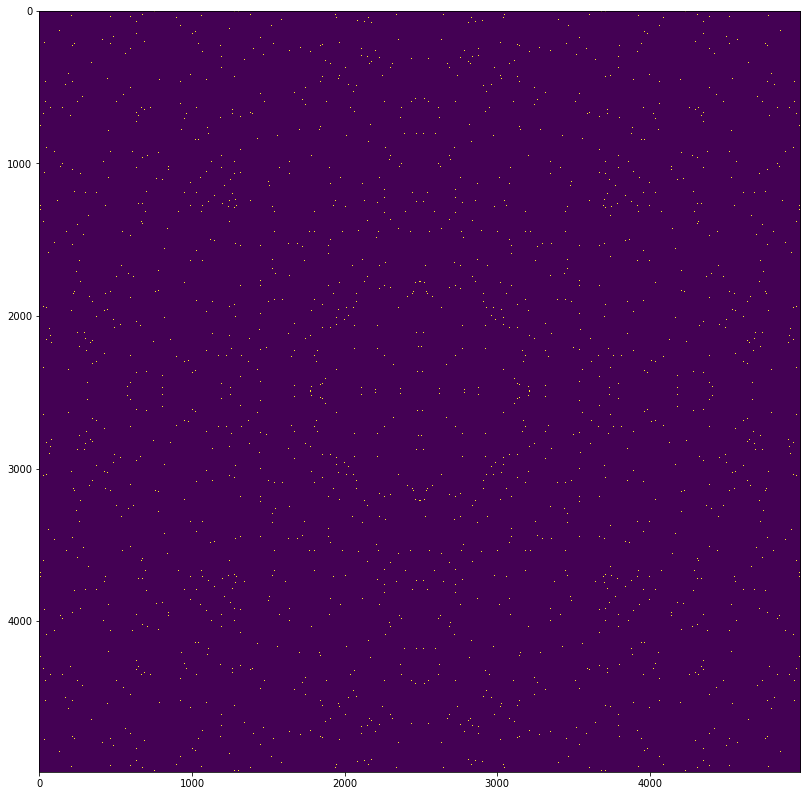

In [61]:
thr = 2e-5
iz = xy[d:-d,d:-d][count<thr]
figure(figsize=(14,14))
imshow(count<thr)
show()

microd = 20.0/K/M
rotation  = exp(linspace(-pi,pi,2*M+1)[:2*M]*1j)
centroids = coalesce(iz,edgesNearby(iz,microd))

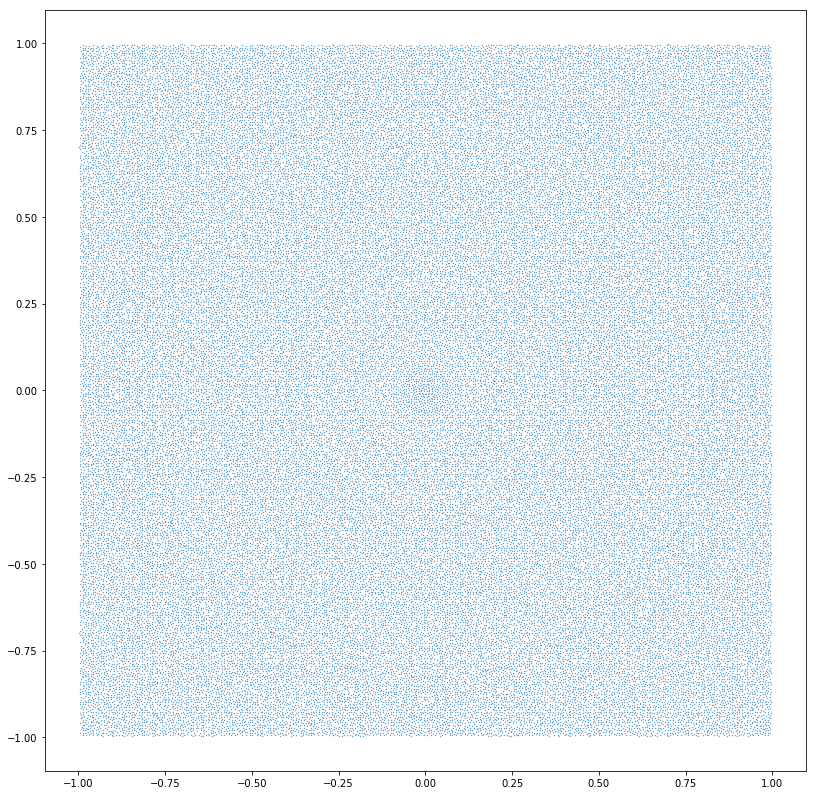

In [62]:
#centroids = np.concatenate([centroids,conj(centroids)])
#centroids = coalesce(centroids,edgesNearby(centroids,microd))
#centroids = np.concatenate([centroids,-1j*conj(1j*centroids)])
#centroids = coalesce(centroids,edgesNearby(centroids,microd))
#centroids = ravel(centroids[:,None]*rotation[None,:])

centroids = array(centroids)
    
figure(figsize=(14,14))
points = array([real(centroids),imag(centroids)])
scatter(*points,s=.1)
force_aspect()

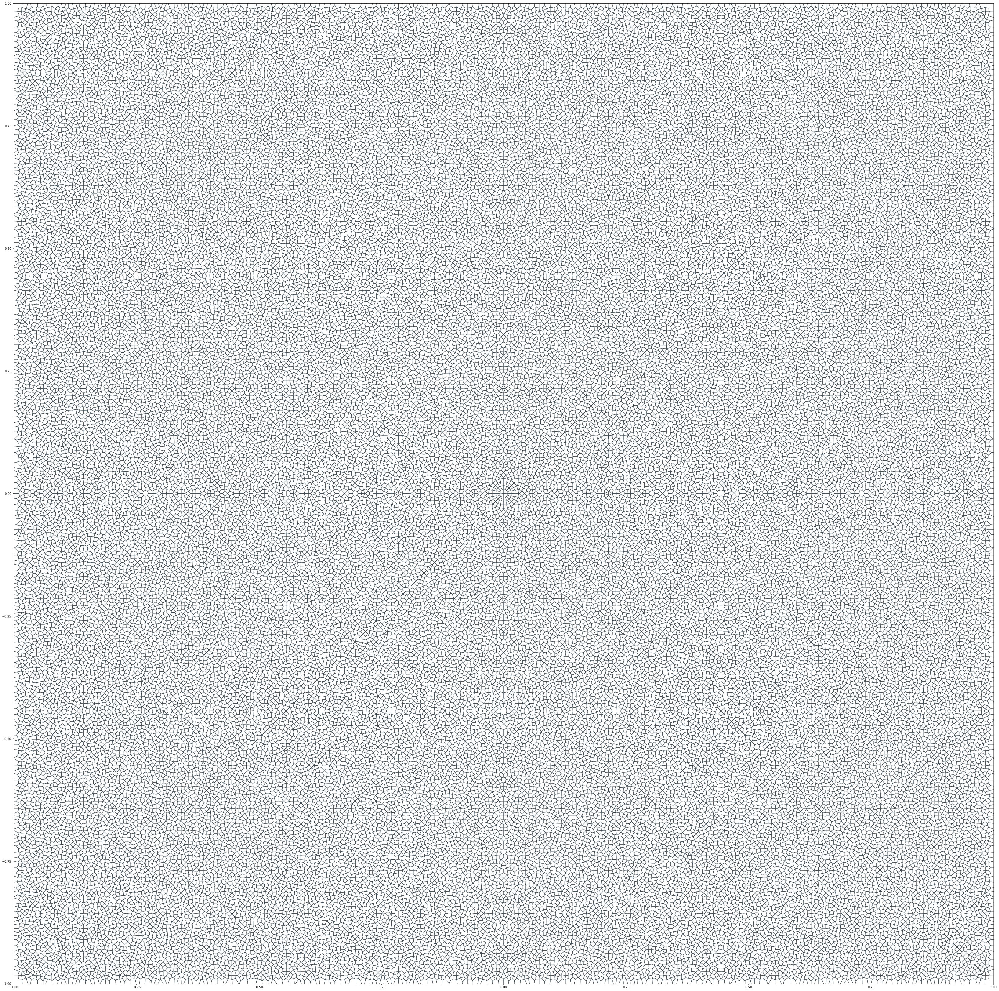

In [63]:
from scipy.spatial import Voronoi, voronoi_plot_2d

points = array([real(centroids),imag(centroids)])
vor = Voronoi(points.T,qhull_options="Qc")
vor.regions
vor.point_region
v = vor.vertices
v = v[:,0]+1j*v[:,1]
ok = array([(all(array(i)>=0)) for i in vor.regions])
r  = array( vor.regions)[ok]
nc = array([mean(v[rr]) for rr in r])

ee = concatenate([array(list(zip(array(e)[arange(-1,len(e))],e))) for e in r])
figure(figsize=(59,59))
plot_edges(v,ee,color=BLACK,lw=1)
degree = array(list(map(len,r)))
#scatter(*z2xy(nc[degree==M+1].T),s=400,color=RUST)
##scatter(*z2xy(nc[degree==M].T),s=400,color=OCHRE)
#scatter(*z2xy(nc[degree==M-1].T),s=400,color=TURQUOISE)
xlim(-1,1)
ylim(-1,1)
force_aspect()

show()

In [64]:
vor.points.shape, len(vor.regions)

((68952, 2), 68952)